#### Copyright(C) 2023 Habana Labs, Ltd. an Intel Company.

### Licensed under the Apache License, Version 2.0
You may not use this file except in compliance with the License. You may obtain a copy of the License at https://www.apache.org/licenses/LICENSE-2.0 Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied. See the License for the specific language governing permissions and limitations under the License.

# Retail: Object Detection in Stores using Transfer Learning

## Table of Contents
1. [Introduction](#introdution)
2. [Setup](#setup)
3. [Prepare the dataset](#dataset)
4. [Download the checkpoint](#checkpoint)
5. [Feature extraction and finetuning](#finetune)
6. [Loss curve](#loss)
7. [Inference example](#inference-example)
8. [Finetuning on 8 HPUs](#multicard)

<a id='introduction'></a>
## Introduction

This notebook shows an example of finetuning PyTorch [YOLOX](https://arxiv.org/abs/2107.08430) for end-to-end retail use case. In this notebook, we use transfer learning technique based on the source code of pretraining PyTorch YOLOX implemented by Habana in the [Model-References repository](https://github.com/HabanaAI/Model-References/tree/1.7.1/PyTorch/computer_vision/detection/yolox) 
and finetuned with [SKU110K dataset](https://github.com/eg4000/SKU110K_CVPR19). It takes store shelf images as input and detects items by creating bounding boxes around them. With YOLOX checkpoint pretrained with COCO dataset, we freeze the backbone layers for feature extraction and then finetune it with SKU100K dataset. We will show how fast and easy it is to finetune a deep learning model based on existing source code in Habana [Model-References repository](https://github.com/HabanaAI/Model-References) on Habana Gaudi system.
To learn more about training Habana models on Gaudi, refer to Habana [Model-References repository](https://github.com/HabanaAI/Model-References).

<a id='setup'></a>
## Setup

This notebook runs on a Gaudi system with SynapseAI and Gaudi drivers installed. Please refer to the [installation guide](https://docs.habana.ai/en/latest/Installation_Guide/index.html) for more information.

### Install dependencies

In [1]:
%pip install opencv_python loguru scikit-image Pillow thop ninja tabulate cython pycocotools==2.0.6 onnx==1.8.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 13.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 12.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 13.0 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 12.9 MB/s eta 0:00:00a 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 12.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 11.3 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 13.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 13.0 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 11.3 MB/s eta 

### Clone Model-References repository

In [2]:
!git clone -b 1.8.0 https://github.com/HabanaAI/Model-References.git

Cloning into 'Model-References'...
remote: Enumerating objects: 14515, done.
remote: Counting objects: 100% (14514/14514), done.
remote: Compressing objects: 100% (6233/6233), done.
remote: Total 14515 (delta 7910), reused 14447 (delta 7874), pack-reused 1
Receiving objects: 100% (14515/14515), 100.74 MiB | 8.02 MiB/s, done.
Resolving deltas: 100% (7910/7910), done.
Updating files: 100% (5855/5855), done.


### Add YOLOX model paths from Model-References Github repository

After cloning the [Model References](https://github.com/HabanaAI/Model-References) repository, add the repository path to the PYTHONPATH environment variable. The transfer learning task depends on Habana's YoloX modules in [Model References](https://github.com/HabanaAI/Model-References/tree/master/PyTorch/computer_vision/detection/yolox) repository.

Configure these example paths by running below cell:
1. Based on the above step where Model-References was cloned, provide the complete path of the yolox folder.
2. Configure the path to retail folder of Gaudi-Solution github repository.

**Note:** The example paths should be replaced with full path to the location of each repository at the user's end.

In [1]:
import sys
sys.path.append('/root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox')
sys.path.append('/root/Gaudi-Solutions/retail/')

### Install YOLOX model from Model-References repository to use YOLOX modules

In [4]:
pip install -v -e ./Model-References/PyTorch/computer_vision/detection/yolox/.

Using pip 22.3 from /usr/local/lib/python3.8/dist-packages/pip (python 3.8)
Obtaining file:///root/tf/mlclean/retail/Model-References/PyTorch/computer_vision/detection/yolox
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-dozupl_5/yolox.egg-info
  writing /tmp/pip-pip-egg-info-dozupl_5/yolox.egg-info/PKG-INFO
  writing dependency_links to /tmp/pip-pip-egg-info-dozupl_5/yolox.egg-info/dependency_links.txt
  writing requirements to /tmp/pip-pip-egg-info-dozupl_5/yolox.egg-info/requires.txt
  writing top-level names to /tmp/pip-pip-egg-info-dozupl_5/yolox.egg-info/top_level.txt
  writing manifest file '/tmp/pip-pip-egg-info-dozupl_5/yolox.egg-info/SOURCES.txt'
  reading manifest file '/tmp/pip-pip-egg-info-dozupl_5/yolox.egg-info/SOURCES.txt'
  adding license file 'LICENSE'
  writing manifest file '/tmp/pip-pip-egg-info-dozupl_5/yolox.egg-info/SOURCES.txt'
  Preparing metadata (setup.py) ... done
  Running setup.py develop for yolox
    Runni

    [2/2] c++ -MMD -MF /root/tf/mlclean/retail/Model-References/PyTorch/computer_vision/detection/yolox/build/temp.linux-x86_64-3.8/root/tf/mlclean/retail/Model-References/PyTorch/computer_vision/detection/yolox/yolox/layers/csrc/vision.o.d -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/root/tf/mlclean/retail/Model-References/PyTorch/computer_vision/detection/yolox/yolox/layers/csrc -I/usr/local/lib/python3.8/dist-packages/torch/include -I/usr/local/lib/python3.8/dist-packages/torch/include/torch/csrc/api/include -I/usr/local/lib/python3.8/dist-packages/torch/include/TH -I/usr/local/lib/python3.8/dist-packages/torch/include/THC -I/usr/include/python3.8 -c -c /root/tf/mlclean/retail/Model-References/PyTorch/computer_vision/detection/yolox/yolox/layers/csrc/vision.cpp -o /root/tf/mlclean

### Import dependent modules

In [2]:
from csv_json import create_json
import os
import argparse
from argparse import Namespace
import random
import warnings
import time
import torch
from loguru import logger
from yolox.core import launch
from yolox.core.trainer import Trainer
from yolox.exp import get_exp
import numpy as np
import json
import pandas as pd
import cv2
from yolox.tools.demo import Predictor
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image

<a id='dataset'></a>
## Prepare the dataset

**DISCLAIMER** <br>
Users bear sole liability and responsibility to follow and comply with any third party licenses, and Habana Labs disclaims and will bear no liability with respect to users’ use or compliance with third party licenses.

Run the below command to create required directories which will help us to download the dataset at the correct path.



In [1]:
!mkdir -p /root/data/SKU110K

Run the below command to download and extract [SKU110K](https://github.com/eg4000/SKU110K_CVPR19#dataset) dataset at the correct location `/root/data/SKU110K/`

In [5]:
!wget -c http://trax-geometry.s3.amazonaws.com/cvpr_challenge/SKU110K_fixed.tar.gz -O - | tar -xz -C /root/data/SKU110K/

--2023-02-03 21:06:27--  http://trax-geometry.s3.amazonaws.com/cvpr_challenge/SKU110K_fixed.tar.gz
Resolving proxy-us.intel.com (proxy-us.intel.com)... 10.1.192.48
Connecting to proxy-us.intel.com (proxy-us.intel.com)|10.1.192.48|:911... connected.
Proxy request sent, awaiting response... 200 OK
Length: 12196152718 (11G) [application/x-gzip]
Saving to: ‘STDOUT’

-                     4%[                    ] 520.66M  35.9MB/s    eta 5m 32s ^C


Once the dataset is downloaded and extracted, there will be two folders namely images and annotations inside main folder- SKU110K_fixed.

(1) **images folder:**<br>
Split the images folder into 3 folders namely train2017, val2017 and test2017. Copy or move train, val and test images from images folder to the train2017, val2017 and test2017 newly created folders respectively.

(2) **annotations folder:**<br>
There are 3 annotations .csv files one each of train, test and validation. They need to be converted to .json format based on COCO dataset format so they can be parsed while training on yolox. The below section helps with the conversion of the files.

**NOTE:**<br> 
(1) It is required to create train2107, test2017 and val2017 folders and place them under SKU110K_fixed folder. The train2017, test2017 and val2017 folders should also be in same hierarchy as annotations folder. Below mentioned levelling of folders gives a glimpse of the structure of input data directory i.e SKU110K_fixed for training.<br> 

<pre>
     SKU110K_fixed
           |____annotations (contains test, train, val .json files)
           |____train2017   (contains all train .jpg images)
           |____val2017     (contains all validation .jpg images)
           |____test2017    (contains all test .jpg images)
</pre>
(2) It is required to run the below provided sections to convert .csv annotation file to .json file and placing the converted .json file inside the same annotations folder. This is important because the dataloader API will read them from the same annotations folder under SKU110K_fixed folder.

If the data (train2017, test2017 and val2017) folders and annotations folder are not in right hierarchy and format, then you will get data processing errors.

### Convert train .csv annotation file to .json format

Set below parameters:
- csv_input_train= 'Path to your train .csv annotation file of SKU110K dataset'
- json_output_train= 'Path to your train .json annotation file in same annotation folder'

In [6]:
csv_input_train= '/root/data/SKU110K/SKU110K_fixed/annotations/annotations_train.csv'
json_output_train= '/root/data/SKU110K/SKU110K_fixed/annotations/annot_sku_train.json'
create_json(csv_input_train, json_output_train)

### Convert validation .csv annotation file to .json format

Set below parameters:
- csv_input_val= 'Path to your val .csv annotation file of SKU110K dataset'
- json_output_val= 'Path to your val .json annotation file in same annotation folder'

In [2]:
csv_input_val= '/root/data/SKU110K/SKU110K_fixed/annotations/annotations_val.csv'
json_output_val= '/root/data/SKU110K/SKU110K_fixed/annotations/annot_sku_val.json'
create_json(csv_input_val, json_output_val)

### Convert test .csv annotation file to .json format

Set below parameters:
- csv_input_test= 'Path to your test .csv annotation file of SKU110K dataset'
- json_output_test= 'Path to your test .json annotation file in same annotation folder'

In [ ]:
csv_input_test= '/root/data/SKU110K/SKU110K_fixed/annotations/annotations_test.csv'
json_output_test= '/root/data/SKU110K/SKU110K_fixed/annotations/annot_sku_test.json'
create_json(csv_input_test, json_output_test)

**NOTE**: At this step it is assumed that the dataset is downloaded and converted to required format as mentioned above before starting the finetuning process in the next steps.

<a id='checkpoint'></a>
## Download the checkpoint
We can perform the finetuning task on HPU by also using the pretrained [checkpoint](https://github.com/Megvii-BaseDetection/YOLOX/releases/download/0.1.1rc0/yolox_s.pth) based on GPU.

The [checkpoint](https://github.com/Megvii-BaseDetection/YOLOX/releases/download/0.1.1rc0/yolox_s.pth) should be downloaded in the retail folder location: `/root/Gaudi-Solutions/retail/`

This checkpoint is generated on GPU by fully training the YOLOX model from scratch on COCO dataset and saving the weights of the model in yolox_s.pth file.

To finetune the model on HPU with GPU based YOLOX checkpoint, couple of amendments need to be made in **trainer.py** script located in `/root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/yolox/core/` directory of Model-References.

(1) Change map_location of torch.load:
In line 433 of **trainer.py** change `map_location="cpu"`. The updated code change in `line 433` is shown below:<br>
```python 
ckpt = torch.load(ckpt_file, map_location='cpu')["model"]
```

(2) Model on hpu: To make sure the model is back on hpu, add `model.to(self.device)` on line 222 of **trainer.py** after line 221 which has `self.resume_train(model)` code. The new added code change on `line 222` is shown below:<br>
```python
model.to(self.device)
```

<a id='finetune'></a>
 ## Feature extraction and finetuning
 The below section contains functions which helps to train for finetuning and evaluation of YOLOX model. It further imports model definition and other important modules from the yolox directory of Model-References GitHub repository as well as the modules present in retail folder of Gaudi-Solutions GitHub repository. Both these repository must be provided in PYTHONPATH of jupyter as mentioned in Setup instructions at the beginning of the notebook.

### Training for Feature extraction

We divide the process into two parts. In the first step - training for feature extraction, we use the COCO dataset based fully trained YOLOX model's [checkpoint](https://github.com/Megvii-BaseDetection/YOLOX/releases/download/0.1.1rc0/yolox_s.pth). Here we freeze the backbone of the model and train it for 1 epoch on SKU110K dataset to obtain the checkpoint for finetuning in next step. The below configured settings helps to extract the features of the model for SKU110K dataset.<br>

Set below parameters in the command line before running the train for feature extraction step:
- -c = Path to the directory where checkpoint obtained from the above feature extraction step is stored
- --data_dir = Path to the directory where Train2017 and Val2017 are present which contains train data and validation data respectively
- outputdir = Path of the output directory where finetuning checkpoints and evaluation results are stored.
- --hmp-bf16 = Full path of `ops_bf16_yolox.txt` file
- --hmp-fp32 = Full path of `ops_fp32_yolox.txt` file

**Note:** <br>
(1) Make sure full path of the files `train.py`, `ops_bf16_yolox.txt` and  `ops_fp32_yolox.txt` located in Model-References' yolox directory is provided in below command line.<br>
(2) Make sure other parameters are kept as it is for running correct feature extraction.

In [34]:
!python3 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/tools/train.py --name yolox-s --batch-size 16 --data_dir /root/data/SKU110K/SKU110K_fixed/ --hpu --hmp --hmp-bf16 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_bf16_yolox.txt --hmp-fp32 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_fp32_yolox.txt --freeze --noresize -c /root/Gaudi-Solutions/retail/yolox_s.pth max_epoch 1 warmup_epochs 0 output_dir /root/Gaudi-Solutions/retail/yolox_output_feature_1x_16 train_ann "annot_sku_train.json" val_ann "annot_sku_val.json" num_classes 1

hmp:verbose_mode  False
hmp:opt_level O1
2023-01-25 19:30:23 | INFO     | yolox.core.trainer:199 - args: Namespace(batch_size=16, cache=False, ckpt='/root/tf/mlclean/retail/yolox_s.pth', data_dir='/root/software/data/SKU110K/SKU110K_fixed/', devices=None, dist_backend='hccl', dist_url=None, exp_file=None, experiment_name='yolox_s', fp16=False, freeze=True, hmp=True, hmp_bf16='/root/tf/mlclean/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_bf16_yolox.txt', hmp_fp32='/root/tf/mlclean/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_fp32_yolox.txt', hmp_verbose=False, hpu=True, logger='tensorboard', machine_rank=0, name='yolox-s', noresize=True, num_machines=1, occupy=False, opts=['max_epoch', '1', 'warmup_epochs', '0', 'output_dir', '/root/tf/mlclean/retail/yolox_output_feature_1x_16', 'train_ann', 'annot_sku_train.json', 'val_ann', 'annot_sku_val.json', 'num_classes', '1'], resume=False, start_epoch=None, use_lazy_mode=True)
2023-01-25 19:30:23 | 

2023-01-25 19:30:25 | INFO     | yolox.core.trainer:214 - Model Summary: Params: 8.94M, Gflops: 26.76
2023-01-25 19:30:25 | INFO     | yolox.core.trainer:431 - loading checkpoint for fine tuning
2023-01-25 19:30:26 | WARNING  | yolox.utils.checkpoint:24 - Shape of head.cls_preds.0.weight in checkpoint is torch.Size([80, 128, 1, 1]), while shape of head.cls_preds.0.weight in model is torch.Size([1, 128, 1, 1]).
2023-01-25 19:30:26 | WARNING  | yolox.utils.checkpoint:24 - Shape of head.cls_preds.0.bias in checkpoint is torch.Size([80]), while shape of head.cls_preds.0.bias in model is torch.Size([1]).
2023-01-25 19:30:26 | WARNING  | yolox.utils.checkpoint:24 - Shape of head.cls_preds.1.weight in checkpoint is torch.Size([80, 128, 1, 1]), while shape of head.cls_preds.1.weight in model is torch.Size([1, 128, 1, 1]).
2023-01-25 19:30:26 | WARNING  | yolox.utils.checkpoint:24 - Shape of head.cls_preds.1.bias in checkpoint is torch.Size([80]), while shape of head.cls_preds.1.bias in model i

2023-01-25 19:31:34 | INFO     | yolox.core.trainer:383 - epoch: 1/1, iter: 10/512, iter_time: 2.364s, data_time: 0.185s, global_avg_time: 2.364s, total_loss: 8.8, iou_loss: 2.9, l1_loss: 1.3, conf_loss: 3.6, cls_loss: 1.1, lr: 1.250e-04, size: 640, ETA: 0:19:46
2023-01-25 19:31:41 | INFO     | yolox.core.trainer:383 - epoch: 1/1, iter: 20/512, iter_time: 0.695s, data_time: 0.504s, global_avg_time: 1.529s, total_loss: 7.4, iou_loss: 2.8, l1_loss: 1.2, conf_loss: 2.6, cls_loss: 0.8, lr: 1.250e-04, size: 640, ETA: 0:12:32
2023-01-25 19:31:49 | INFO     | yolox.core.trainer:383 - epoch: 1/1, iter: 30/512, iter_time: 0.731s, data_time: 0.543s, global_avg_time: 1.263s, total_loss: 7.1, iou_loss: 2.9, l1_loss: 1.2, conf_loss: 2.2, cls_loss: 0.8, lr: 1.250e-04, size: 640, ETA: 0:10:08
2023-01-25 19:31:55 | INFO     | yolox.core.trainer:383 - epoch: 1/1, iter: 40/512, iter_time: 0.669s, data_time: 0.478s, global_avg_time: 1.115s, total_loss: 7.0, iou_loss: 2.8, l1_loss: 1.3, conf_loss: 2.2, cl

2023-01-25 19:34:48 | INFO     | yolox.core.trainer:383 - epoch: 1/1, iter: 280/512, iter_time: 0.750s, data_time: 0.561s, global_avg_time: 0.777s, total_loss: 6.8, iou_loss: 2.9, l1_loss: 1.2, conf_loss: 2.0, cls_loss: 0.7, lr: 1.250e-04, size: 640, ETA: 0:03:00
2023-01-25 19:34:56 | INFO     | yolox.core.trainer:383 - epoch: 1/1, iter: 290/512, iter_time: 0.722s, data_time: 0.534s, global_avg_time: 0.776s, total_loss: 6.2, iou_loss: 2.7, l1_loss: 1.1, conf_loss: 1.8, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 0:02:52
2023-01-25 19:35:03 | INFO     | yolox.core.trainer:383 - epoch: 1/1, iter: 300/512, iter_time: 0.701s, data_time: 0.513s, global_avg_time: 0.773s, total_loss: 5.9, iou_loss: 2.6, l1_loss: 1.0, conf_loss: 1.8, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 0:02:43
2023-01-25 19:35:09 | INFO     | yolox.core.trainer:383 - epoch: 1/1, iter: 310/512, iter_time: 0.682s, data_time: 0.492s, global_avg_time: 0.770s, total_loss: 6.2, iou_loss: 2.7, l1_loss: 1.0, conf_loss: 1.9

Running per image evaluation...
Evaluate annotation type *bbox*
COCOeval_opt.evaluate() finished in 2.89 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.
2023-01-25 19:38:57 | INFO     | yolox.core.trainer:465 - 
Average forward time: 1.46 ms, Average NMS time: 104.85 ms, Average inference time: 106.31 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.165
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.362
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.124
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.218
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.003
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.031
 Ave

### Finetune and Evaulate the Model

In the second step, we train to finetune the model for 8 epochs. Here the complete model is trained without freezing any layer on SKU110K dataset by using checkpoint obtained during above step- training for feature extration. The model converges at 8th epoch.<br>

After finetuning, we auto evaulate the model. The validation data in val2017 directory is used for evaluation. The evaluation uses same metrics (AP @[IoU=0.50:0.95]) like COCO dataset.

In [3]:
@logger.catch
def run(checkpoint, datadir, outputdir, batchsize, maxepoch, freeze_val):
    def main_function(exp, args):
        exp.data_dir = args.data_dir
        if exp.seed is not None:
            random.seed(exp.seed)
            np.random.seed(exp.seed)
            torch.manual_seed(exp.seed)
            warnings.warn(
                "You have chosen to seed training. This will turn on the CUDNN deterministic setting, "
                "which can slow down your training considerably! You may see unexpected behavior "
                "when restarting from checkpoints."
            )
        trainer = Trainer(exp, args)
        trainer.train()


    maxepoch = str(maxepoch)
    outputdir = str(outputdir)
    args = Namespace(dist_backend='hccl',
        experiment_name=None,
        name='yolox-s',
        dist_url=None,
        batch_size= batchsize,
        devices= 1,
        exp_file=None,
        resume=False,
        ckpt=checkpoint,
        start_epoch=None,
        num_machines=1,
        machine_rank=0,
        fp16=False,
        cache=False,
        occupy=False,
        logger='tensorboard',
        hpu=True,
        freeze=freeze_val,
        noresize=True,
        use_lazy_mode=True,
        hmp=True,
        hmp_bf16='./Model-References/PyTorch/computer_vision/detection/yolox/ops_bf16_yolox.txt',
        hmp_fp32='./Model-References/PyTorch/computer_vision/detection/yolox/ops_fp32_yolox.txt',
        hmp_verbose=False,
        data_dir=datadir,
        opts=['max_epoch', maxepoch, 
        'warmup_epochs', '0', 
        'output_dir', outputdir, 
        'train_ann', 'annot_sku_train.json', 
        'val_ann', 'annot_sku_val.json', 
        'num_classes', '1'])

    exp = get_exp(args.exp_file, args.name)
    exp.merge(args.opts)

    if not args.use_lazy_mode:
        logger.error("YOLOX eager mode is not supported.")
        exit(1)

    if not args.experiment_name:
        args.experiment_name = exp.exp_name

    if args.hpu:
        num_gpu = 0 if args.devices is None else args.devices

    args.dist_url = "auto" if args.dist_url is None else args.dist_url
    main_function(exp, args)

The below configured settings help to finetune and then evaluate the YOLOX model on SKU110K dataset in 8 epochs.<br>
Set below parameters:

- checkpoint_ft = Path to the directory where checkpoint obtained from the above feature extraction step is stored
- datadir_ft = Path to the directory where Train2017 and Val2017 are present which contains train data and validation data respectively
- outputdir_ft = Path of the output directory where finetuning checkpoints and evaluation results are stored.

In [4]:
checkpoint_ft = '/root/Gaudi-Solutions/retail/yolox_output_feature_1x_16/yolox_s/best_ckpt.pth'
datadir_ft = '/root/data/SKU110K/SKU110K_fixed/'
outputdir_ft = '/root/Gaudi-Solutions/retail/yolox_output_finetune_1x_16'
batchsize_ft = 16
maxepoch_ft = 8
freeze_ft = False

run(checkpoint_ft, datadir_ft, outputdir_ft, batchsize_ft, maxepoch_ft, freeze_ft)

2023-01-26 06:25:24 | INFO     | yolox.core.trainer:199 - args: Namespace(batch_size=16, cache=False, ckpt='/root/tf/mlclean/retail/yolox_output_feature_1x_16/yolox_s/best_ckpt.pth', data_dir='/root/software/data/SKU110K/SKU110K_fixed/', devices=1, dist_backend='hccl', dist_url='auto', exp_file=None, experiment_name='yolox_s', fp16=False, freeze=False, hmp=True, hmp_bf16='./Model-References/PyTorch/computer_vision/detection/yolox/ops_bf16_yolox.txt', hmp_fp32='./Model-References/PyTorch/computer_vision/detection/yolox/ops_fp32_yolox.txt', hmp_verbose=False, hpu=True, logger='tensorboard', machine_rank=0, name='yolox-s', noresize=True, num_machines=1, occupy=False, opts=['max_epoch', '8', 'warmup_epochs', '0', 'output_dir', '/root/tf/mlclean/retail/yolox_output_finetune_1x_16', 'train_ann', 'annot_sku_train.json', 'val_ann', 'annot_sku_val.json', 'num_classes', '1'], resume=False, start_epoch=None, use_lazy_mode=True)
2023-01-26 06:25:24 | INFO     | yolox.core.trainer:200 - exp value:


hmp:verbose_mode  False
hmp:opt_level O1


=============================HABANA PT BRIDGE CONFIGURATION =========================== 
 PT_HPU_LAZY_MODE = 1
 PT_HPU_LAZY_EAGER_OPTIM_CACHE = 1
 PT_HPU_ENABLE_COMPILE_THREAD = 0
 PT_HPU_ENABLE_EXECUTION_THREAD = 1
 PT_HPU_ENABLE_LAZY_EAGER_EXECUTION_THREAD = 1
 PT_ENABLE_INTER_HOST_CACHING = 0
 PT_ENABLE_INFERENCE_MODE = 1
 PT_ENABLE_HABANA_CACHING = 1
 PT_HPU_MAX_RECIPE_SUBMISSION_LIMIT = 0
 PT_HPU_MAX_COMPOUND_OP_SIZE = 9223372036854775807
 PT_HPU_MAX_COMPOUND_OP_SIZE_SS = 10
 PT_HPU_ENABLE_STAGE_SUBMISSION = 1
 PT_HPU_PGM_ENABLE_CACHE = 1
 PT_HPU_ENABLE_LAZY_COLLECTIVES = 0
 PT_HCCL_SLICE_SIZE_MB = 16
 PT_HCCL_MEMORY_ALLOWANCE_MB = 384
 PT_HPU_INITIAL_WORKSPACE_SIZE = 0
 PT_HABANA_POOL_SIZE = 24
 PT_HPU_POOL_STRATEGY = 5
 PT_HPU_POOL_LOG_FRAGMENTATION_INFO = 0
 PT_ENABLE_MEMORY_DEFRAGMENTATION = 1
 PT_ENABLE_DEFRAGMENTATION_INFO = 0
 PT_HPU_ENABLE_SYNAPSE_LAYOUT_HANDLING = 1
 PT_HPU_ENABLE_SYNAPSE_OUTPUT_PERMUTE = 1
 PT_HPU_ENABLE_VALID_DATA_RANGE_CHECK = 1
 PT_HPU_FORCE_USE_DEFAU

2023-01-26 06:26:11 | INFO     | yolox.core.trainer:300 - ---> start train epoch1
2023-01-26 06:26:11 | INFO     | yolox.core.trainer:303 - --->No mosaic aug now!
2023-01-26 06:26:11 | INFO     | yolox.core.trainer:305 - --->Add additional L1 loss now!
2023-01-26 06:26:49 | INFO     | yolox.core.trainer:383 - epoch: 1/8, iter: 10/512, iter_time: 3.731s, data_time: 0.164s, global_avg_time: 3.731s, total_loss: 5.7, iou_loss: 2.5, l1_loss: 1.0, conf_loss: 1.6, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 4:14:02
2023-01-26 06:26:56 | INFO     | yolox.core.trainer:383 - epoch: 1/8, iter: 20/512, iter_time: 0.710s, data_time: 0.486s, global_avg_time: 2.220s, total_loss: 5.3, iou_loss: 2.3, l1_loss: 0.8, conf_loss: 1.5, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 2:30:50
2023-01-26 06:27:03 | INFO     | yolox.core.trainer:383 - epoch: 1/8, iter: 30/512, iter_time: 0.743s, data_time: 0.512s, global_avg_time: 1.728s, total_loss: 5.5, iou_loss: 2.4, l1_loss: 0.9, conf_loss: 1.6, cls_loss: 0.

2023-01-26 06:30:23 | INFO     | yolox.core.trainer:383 - epoch: 1/8, iter: 320/512, iter_time: 0.673s, data_time: 0.451s, global_avg_time: 0.786s, total_loss: 5.1, iou_loss: 2.3, l1_loss: 0.8, conf_loss: 1.5, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 0:49:29
2023-01-26 06:30:30 | INFO     | yolox.core.trainer:383 - epoch: 1/8, iter: 330/512, iter_time: 0.713s, data_time: 0.493s, global_avg_time: 0.784s, total_loss: 5.0, iou_loss: 2.2, l1_loss: 0.7, conf_loss: 1.5, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 0:49:13
2023-01-26 06:30:37 | INFO     | yolox.core.trainer:383 - epoch: 1/8, iter: 340/512, iter_time: 0.658s, data_time: 0.436s, global_avg_time: 0.780s, total_loss: 4.7, iou_loss: 2.1, l1_loss: 0.7, conf_loss: 1.3, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 0:48:51
2023-01-26 06:30:44 | INFO     | yolox.core.trainer:383 - epoch: 1/8, iter: 350/512, iter_time: 0.677s, data_time: 0.457s, global_avg_time: 0.777s, total_loss: 4.4, iou_loss: 2.1, l1_loss: 0.7, conf_loss: 1.1

 97%|#########7| 36/37 [01:06<00:01,  1.37s/it]

2023-01-26 06:33:46 | INFO     | yolox.evaluators.coco_evaluator:249 - Evaluate in main process...



100%|##########| 37/37 [01:09<00:00,  1.87s/it]


2023-01-26 06:33:50 | INFO     | yolox.evaluators.coco_evaluator:282 - Loading and preparing results...
2023-01-26 06:33:53 | INFO     | yolox.evaluators.coco_evaluator:282 - DONE (t=2.45s)
2023-01-26 06:33:53 | INFO     | pycocotools.coco:366 - creating index...
2023-01-26 06:33:53 | INFO     | pycocotools.coco:366 - index created!


Running per image evaluation...
Evaluate annotation type *bbox*
COCOeval_opt.evaluate() finished in 2.48 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.


2023-01-26 06:33:56 | INFO     | yolox.core.trainer:465 - 
Average forward time: 1.48 ms, Average NMS time: 101.52 ms, Average inference time: 103.00 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.535
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.289
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.004
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.043
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2023-01-26 06:36:47 | INFO     | yolox.core.trainer:383 - epoch: 2/8, iter: 240/512, iter_time: 0.718s, data_time: 0.492s, global_avg_time: 0.730s, total_loss: 4.4, iou_loss: 2.0, l1_loss: 0.6, conf_loss: 1.3, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:40:39
2023-01-26 06:36:54 | INFO     | yolox.core.trainer:383 - epoch: 2/8, iter: 250/512, iter_time: 0.696s, data_time: 0.473s, global_avg_time: 0.729s, total_loss: 4.2, iou_loss: 2.0, l1_loss: 0.6, conf_loss: 1.2, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:40:30
2023-01-26 06:37:00 | INFO     | yolox.core.trainer:383 - epoch: 2/8, iter: 260/512, iter_time: 0.669s, data_time: 0.445s, global_avg_time: 0.728s, total_loss: 5.2, iou_loss: 2.3, l1_loss: 0.8, conf_loss: 1.6, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 0:40:21
2023-01-26 06:37:07 | INFO     | yolox.core.trainer:383 - epoch: 2/8, iter: 270/512, iter_time: 0.665s, data_time: 0.439s, global_avg_time: 0.728s, total_loss: 4.2, iou_loss: 2.0, l1_loss: 0.6, conf_loss: 1.2

 97%|#########7| 36/37 [00:47<00:01,  1.15s/it]

2023-01-26 06:40:42 | INFO     | yolox.evaluators.coco_evaluator:249 - Evaluate in main process...



100%|##########| 37/37 [00:47<00:00,  1.29s/it]


2023-01-26 06:40:46 | INFO     | yolox.evaluators.coco_evaluator:282 - Loading and preparing results...
2023-01-26 06:40:47 | INFO     | yolox.evaluators.coco_evaluator:282 - DONE (t=0.81s)
2023-01-26 06:40:47 | INFO     | pycocotools.coco:366 - creating index...
2023-01-26 06:40:47 | INFO     | pycocotools.coco:366 - index created!


Running per image evaluation...
Evaluate annotation type *bbox*
COCOeval_opt.evaluate() finished in 2.44 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.


2023-01-26 06:40:49 | INFO     | yolox.core.trainer:465 - 
Average forward time: 0.89 ms, Average NMS time: 69.22 ms, Average inference time: 70.12 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.558
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.319
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.357
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.004
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.044
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | are

2023-01-26 06:43:39 | INFO     | yolox.core.trainer:383 - epoch: 3/8, iter: 240/512, iter_time: 0.734s, data_time: 0.508s, global_avg_time: 0.710s, total_loss: 4.5, iou_loss: 2.1, l1_loss: 0.6, conf_loss: 1.3, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 0:33:30
2023-01-26 06:43:46 | INFO     | yolox.core.trainer:383 - epoch: 3/8, iter: 250/512, iter_time: 0.685s, data_time: 0.457s, global_avg_time: 0.710s, total_loss: 4.2, iou_loss: 1.9, l1_loss: 0.5, conf_loss: 1.2, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:33:22
2023-01-26 06:43:53 | INFO     | yolox.core.trainer:383 - epoch: 3/8, iter: 260/512, iter_time: 0.706s, data_time: 0.482s, global_avg_time: 0.710s, total_loss: 4.5, iou_loss: 2.0, l1_loss: 0.6, conf_loss: 1.3, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:33:15
2023-01-26 06:44:00 | INFO     | yolox.core.trainer:383 - epoch: 3/8, iter: 270/512, iter_time: 0.651s, data_time: 0.424s, global_avg_time: 0.709s, total_loss: 4.4, iou_loss: 2.1, l1_loss: 0.6, conf_loss: 1.2

 97%|#########7| 36/37 [00:38<00:00,  1.27it/s]

2023-01-26 06:47:25 | INFO     | yolox.evaluators.coco_evaluator:249 - Evaluate in main process...



100%|##########| 37/37 [00:38<00:00,  1.04s/it]


2023-01-26 06:47:28 | INFO     | yolox.evaluators.coco_evaluator:282 - Loading and preparing results...
2023-01-26 06:47:30 | INFO     | yolox.evaluators.coco_evaluator:282 - DONE (t=2.39s)
2023-01-26 06:47:30 | INFO     | pycocotools.coco:366 - creating index...
2023-01-26 06:47:31 | INFO     | pycocotools.coco:366 - index created!


Running per image evaluation...
Evaluate annotation type *bbox*


2023-01-26 06:47:33 | INFO     | yolox.core.trainer:465 - 
Average forward time: 0.89 ms, Average NMS time: 53.82 ms, Average inference time: 54.71 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.560
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.331
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.364
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.044
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | are

COCOeval_opt.evaluate() finished in 2.46 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.


2023-01-26 06:47:38 | INFO     | yolox.core.trainer:475 - Save weights to /root/tf/mlclean/retail/yolox_output_finetune_1x_16/yolox_s
2023-01-26 06:47:40 | INFO     | yolox.core.trainer:326 - average data loading time (per batch): 0:00:00.456114
2023-01-26 06:47:40 | INFO     | yolox.core.trainer:329 - average iteration time (per batch): 0:00:00.679111
2023-01-26 06:47:40 | INFO     | yolox.core.trainer:331 - average throughput for epoch_3: 23.56 img/sec
2023-01-26 06:47:40 | INFO     | yolox.core.trainer:333 - data loading time (per epoch): 3.89 min
2023-01-26 06:47:40 | INFO     | yolox.core.trainer:334 - epoch_3 time: 5.80 min
2023-01-26 06:47:40 | INFO     | yolox.core.trainer:300 - ---> start train epoch4
2023-01-26 06:47:40 | INFO     | yolox.core.trainer:303 - --->No mosaic aug now!
2023-01-26 06:47:40 | INFO     | yolox.core.trainer:305 - --->Add additional L1 loss now!
2023-01-26 06:47:45 | INFO     | yolox.core.trainer:383 - epoch: 4/8, iter: 10/512, iter_time: 0.486s, data_t

2023-01-26 06:50:53 | INFO     | yolox.core.trainer:383 - epoch: 4/8, iter: 290/512, iter_time: 0.672s, data_time: 0.446s, global_avg_time: 0.698s, total_loss: 4.2, iou_loss: 2.0, l1_loss: 0.6, conf_loss: 1.2, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:26:25
2023-01-26 06:51:00 | INFO     | yolox.core.trainer:383 - epoch: 4/8, iter: 300/512, iter_time: 0.699s, data_time: 0.482s, global_avg_time: 0.698s, total_loss: 4.1, iou_loss: 1.9, l1_loss: 0.5, conf_loss: 1.1, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:26:18
2023-01-26 06:51:07 | INFO     | yolox.core.trainer:383 - epoch: 4/8, iter: 310/512, iter_time: 0.651s, data_time: 0.429s, global_avg_time: 0.698s, total_loss: 4.5, iou_loss: 2.1, l1_loss: 0.6, conf_loss: 1.3, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:26:10
2023-01-26 06:51:14 | INFO     | yolox.core.trainer:383 - epoch: 4/8, iter: 320/512, iter_time: 0.701s, data_time: 0.484s, global_avg_time: 0.698s, total_loss: 4.1, iou_loss: 1.8, l1_loss: 0.5, conf_loss: 1.2

 97%|#########7| 36/37 [00:33<00:00,  1.19it/s]

2023-01-26 06:54:00 | INFO     | yolox.evaluators.coco_evaluator:249 - Evaluate in main process...



100%|##########| 37/37 [00:33<00:00,  1.11it/s]


2023-01-26 06:54:04 | INFO     | yolox.evaluators.coco_evaluator:282 - Loading and preparing results...
2023-01-26 06:54:06 | INFO     | yolox.evaluators.coco_evaluator:282 - DONE (t=2.34s)
2023-01-26 06:54:06 | INFO     | pycocotools.coco:366 - creating index...
2023-01-26 06:54:06 | INFO     | pycocotools.coco:366 - index created!


Running per image evaluation...
Evaluate annotation type *bbox*


2023-01-26 06:54:09 | INFO     | yolox.core.trainer:465 - 
Average forward time: 0.94 ms, Average NMS time: 48.27 ms, Average inference time: 49.21 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.324
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.569
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.336
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.369
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | are

COCOeval_opt.evaluate() finished in 2.40 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.


2023-01-26 06:54:14 | INFO     | yolox.core.trainer:475 - Save weights to /root/tf/mlclean/retail/yolox_output_finetune_1x_16/yolox_s
2023-01-26 06:54:15 | INFO     | yolox.core.trainer:326 - average data loading time (per batch): 0:00:00.453357
2023-01-26 06:54:15 | INFO     | yolox.core.trainer:329 - average iteration time (per batch): 0:00:00.673498
2023-01-26 06:54:15 | INFO     | yolox.core.trainer:331 - average throughput for epoch_4: 23.76 img/sec
2023-01-26 06:54:15 | INFO     | yolox.core.trainer:333 - data loading time (per epoch): 3.87 min
2023-01-26 06:54:15 | INFO     | yolox.core.trainer:334 - epoch_4 time: 5.75 min
2023-01-26 06:54:15 | INFO     | yolox.core.trainer:300 - ---> start train epoch5
2023-01-26 06:54:15 | INFO     | yolox.core.trainer:303 - --->No mosaic aug now!
2023-01-26 06:54:15 | INFO     | yolox.core.trainer:305 - --->Add additional L1 loss now!
2023-01-26 06:54:20 | INFO     | yolox.core.trainer:383 - epoch: 5/8, iter: 10/512, iter_time: 0.462s, data_t

2023-01-26 06:57:29 | INFO     | yolox.core.trainer:383 - epoch: 5/8, iter: 290/512, iter_time: 0.647s, data_time: 0.430s, global_avg_time: 0.693s, total_loss: 4.3, iou_loss: 2.0, l1_loss: 0.5, conf_loss: 1.3, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:20:18
2023-01-26 06:57:36 | INFO     | yolox.core.trainer:383 - epoch: 5/8, iter: 300/512, iter_time: 0.673s, data_time: 0.459s, global_avg_time: 0.693s, total_loss: 4.5, iou_loss: 2.1, l1_loss: 0.6, conf_loss: 1.3, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:20:11
2023-01-26 06:57:43 | INFO     | yolox.core.trainer:383 - epoch: 5/8, iter: 310/512, iter_time: 0.653s, data_time: 0.436s, global_avg_time: 0.693s, total_loss: 4.1, iou_loss: 1.9, l1_loss: 0.6, conf_loss: 1.1, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:20:03
2023-01-26 06:57:49 | INFO     | yolox.core.trainer:383 - epoch: 5/8, iter: 320/512, iter_time: 0.661s, data_time: 0.445s, global_avg_time: 0.692s, total_loss: 4.3, iou_loss: 2.0, l1_loss: 0.6, conf_loss: 1.1

 97%|#########7| 36/37 [00:29<00:00,  1.42it/s]

2023-01-26 07:00:31 | INFO     | yolox.evaluators.coco_evaluator:249 - Evaluate in main process...



100%|##########| 37/37 [00:29<00:00,  1.24it/s]


2023-01-26 07:00:35 | INFO     | yolox.evaluators.coco_evaluator:282 - Loading and preparing results...
2023-01-26 07:00:35 | INFO     | yolox.evaluators.coco_evaluator:282 - DONE (t=0.73s)
2023-01-26 07:00:35 | INFO     | pycocotools.coco:366 - creating index...
2023-01-26 07:00:36 | INFO     | pycocotools.coco:366 - index created!


Running per image evaluation...
Evaluate annotation type *bbox*
COCOeval_opt.evaluate() finished in 2.39 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.


2023-01-26 07:00:38 | INFO     | yolox.core.trainer:465 - 
Average forward time: 0.92 ms, Average NMS time: 38.86 ms, Average inference time: 39.78 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.328
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.570
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.345
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.373
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | are

2023-01-26 07:03:25 | INFO     | yolox.core.trainer:383 - epoch: 6/8, iter: 240/512, iter_time: 0.675s, data_time: 0.450s, global_avg_time: 0.689s, total_loss: 3.9, iou_loss: 1.9, l1_loss: 0.5, conf_loss: 1.0, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:14:53
2023-01-26 07:03:32 | INFO     | yolox.core.trainer:383 - epoch: 6/8, iter: 250/512, iter_time: 0.682s, data_time: 0.465s, global_avg_time: 0.689s, total_loss: 4.5, iou_loss: 2.0, l1_loss: 0.6, conf_loss: 1.3, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:14:46
2023-01-26 07:03:38 | INFO     | yolox.core.trainer:383 - epoch: 6/8, iter: 260/512, iter_time: 0.669s, data_time: 0.451s, global_avg_time: 0.689s, total_loss: 4.0, iou_loss: 1.9, l1_loss: 0.5, conf_loss: 1.1, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:14:39
2023-01-26 07:03:45 | INFO     | yolox.core.trainer:383 - epoch: 6/8, iter: 270/512, iter_time: 0.689s, data_time: 0.472s, global_avg_time: 0.689s, total_loss: 3.9, iou_loss: 1.8, l1_loss: 0.5, conf_loss: 1.1

 97%|#########7| 36/37 [00:26<00:00,  1.58it/s]

2023-01-26 07:06:57 | INFO     | yolox.evaluators.coco_evaluator:249 - Evaluate in main process...



100%|##########| 37/37 [00:26<00:00,  1.39it/s]


2023-01-26 07:07:00 | INFO     | yolox.evaluators.coco_evaluator:282 - Loading and preparing results...
2023-01-26 07:07:02 | INFO     | yolox.evaluators.coco_evaluator:282 - DONE (t=2.30s)
2023-01-26 07:07:02 | INFO     | pycocotools.coco:366 - creating index...
2023-01-26 07:07:02 | INFO     | pycocotools.coco:366 - index created!


Running per image evaluation...
Evaluate annotation type *bbox*


2023-01-26 07:07:05 | INFO     | yolox.core.trainer:465 - 
Average forward time: 0.91 ms, Average NMS time: 33.47 ms, Average inference time: 34.38 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.329
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.571
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.346
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.373
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.373
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.373
 Average Recall     (AR) @[ IoU=0.50:0.95 | are

COCOeval_opt.evaluate() finished in 2.35 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.


2023-01-26 07:07:09 | INFO     | yolox.core.trainer:475 - Save weights to /root/tf/mlclean/retail/yolox_output_finetune_1x_16/yolox_s
2023-01-26 07:07:11 | INFO     | yolox.core.trainer:326 - average data loading time (per batch): 0:00:00.449775
2023-01-26 07:07:11 | INFO     | yolox.core.trainer:329 - average iteration time (per batch): 0:00:00.669636
2023-01-26 07:07:11 | INFO     | yolox.core.trainer:331 - average throughput for epoch_6: 23.89 img/sec
2023-01-26 07:07:11 | INFO     | yolox.core.trainer:333 - data loading time (per epoch): 3.84 min
2023-01-26 07:07:11 | INFO     | yolox.core.trainer:334 - epoch_6 time: 5.72 min
2023-01-26 07:07:11 | INFO     | yolox.core.trainer:300 - ---> start train epoch7
2023-01-26 07:07:11 | INFO     | yolox.core.trainer:303 - --->No mosaic aug now!
2023-01-26 07:07:11 | INFO     | yolox.core.trainer:305 - --->Add additional L1 loss now!
2023-01-26 07:07:16 | INFO     | yolox.core.trainer:383 - epoch: 7/8, iter: 10/512, iter_time: 0.451s, data_t

2023-01-26 07:10:25 | INFO     | yolox.core.trainer:383 - epoch: 7/8, iter: 290/512, iter_time: 0.699s, data_time: 0.483s, global_avg_time: 0.686s, total_loss: 4.1, iou_loss: 1.9, l1_loss: 0.5, conf_loss: 1.1, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:08:23
2023-01-26 07:10:32 | INFO     | yolox.core.trainer:383 - epoch: 7/8, iter: 300/512, iter_time: 0.693s, data_time: 0.472s, global_avg_time: 0.686s, total_loss: 4.1, iou_loss: 1.9, l1_loss: 0.6, conf_loss: 1.1, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:08:16
2023-01-26 07:10:39 | INFO     | yolox.core.trainer:383 - epoch: 7/8, iter: 310/512, iter_time: 0.651s, data_time: 0.433s, global_avg_time: 0.686s, total_loss: 4.2, iou_loss: 1.9, l1_loss: 0.5, conf_loss: 1.3, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:08:09
2023-01-26 07:10:45 | INFO     | yolox.core.trainer:383 - epoch: 7/8, iter: 320/512, iter_time: 0.667s, data_time: 0.448s, global_avg_time: 0.686s, total_loss: 3.8, iou_loss: 1.8, l1_loss: 0.5, conf_loss: 0.9

 97%|#########7| 36/37 [00:24<00:00,  1.80it/s]

2023-01-26 07:13:22 | INFO     | yolox.evaluators.coco_evaluator:249 - Evaluate in main process...



100%|##########| 37/37 [00:25<00:00,  1.46it/s]


2023-01-26 07:13:25 | INFO     | yolox.evaluators.coco_evaluator:282 - Loading and preparing results...
2023-01-26 07:13:27 | INFO     | yolox.evaluators.coco_evaluator:282 - DONE (t=2.26s)
2023-01-26 07:13:27 | INFO     | pycocotools.coco:366 - creating index...
2023-01-26 07:13:27 | INFO     | pycocotools.coco:366 - index created!


Running per image evaluation...
Evaluate annotation type *bbox*


2023-01-26 07:13:30 | INFO     | yolox.core.trainer:465 - 
Average forward time: 0.91 ms, Average NMS time: 33.45 ms, Average inference time: 34.36 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.332
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.571
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.354
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.376
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.375
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.375
 Average Recall     (AR) @[ IoU=0.50:0.95 | are

COCOeval_opt.evaluate() finished in 2.36 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.


2023-01-26 07:13:34 | INFO     | yolox.core.trainer:475 - Save weights to /root/tf/mlclean/retail/yolox_output_finetune_1x_16/yolox_s
2023-01-26 07:13:36 | INFO     | yolox.core.trainer:326 - average data loading time (per batch): 0:00:00.449451
2023-01-26 07:13:36 | INFO     | yolox.core.trainer:329 - average iteration time (per batch): 0:00:00.669344
2023-01-26 07:13:36 | INFO     | yolox.core.trainer:331 - average throughput for epoch_7: 23.90 img/sec
2023-01-26 07:13:36 | INFO     | yolox.core.trainer:333 - data loading time (per epoch): 3.84 min
2023-01-26 07:13:36 | INFO     | yolox.core.trainer:334 - epoch_7 time: 5.72 min
2023-01-26 07:13:36 | INFO     | yolox.core.trainer:300 - ---> start train epoch8
2023-01-26 07:13:36 | INFO     | yolox.core.trainer:303 - --->No mosaic aug now!
2023-01-26 07:13:36 | INFO     | yolox.core.trainer:305 - --->Add additional L1 loss now!
2023-01-26 07:13:41 | INFO     | yolox.core.trainer:383 - epoch: 8/8, iter: 10/512, iter_time: 0.482s, data_t

2023-01-26 07:16:49 | INFO     | yolox.core.trainer:383 - epoch: 8/8, iter: 290/512, iter_time: 0.671s, data_time: 0.452s, global_avg_time: 0.684s, total_loss: 4.6, iou_loss: 2.2, l1_loss: 0.6, conf_loss: 1.2, cls_loss: 0.6, lr: 1.250e-04, size: 640, ETA: 0:02:31
2023-01-26 07:16:56 | INFO     | yolox.core.trainer:383 - epoch: 8/8, iter: 300/512, iter_time: 0.698s, data_time: 0.479s, global_avg_time: 0.684s, total_loss: 4.5, iou_loss: 2.1, l1_loss: 0.6, conf_loss: 1.3, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:02:24
2023-01-26 07:17:03 | INFO     | yolox.core.trainer:383 - epoch: 8/8, iter: 310/512, iter_time: 0.662s, data_time: 0.447s, global_avg_time: 0.684s, total_loss: 4.1, iou_loss: 1.9, l1_loss: 0.5, conf_loss: 1.1, cls_loss: 0.5, lr: 1.250e-04, size: 640, ETA: 0:02:18
2023-01-26 07:17:09 | INFO     | yolox.core.trainer:383 - epoch: 8/8, iter: 320/512, iter_time: 0.651s, data_time: 0.429s, global_avg_time: 0.683s, total_loss: 3.9, iou_loss: 1.8, l1_loss: 0.5, conf_loss: 1.1

 97%|#########7| 36/37 [00:26<00:00,  1.73it/s]

2023-01-26 07:19:47 | INFO     | yolox.evaluators.coco_evaluator:249 - Evaluate in main process...



100%|##########| 37/37 [00:26<00:00,  1.40it/s]


2023-01-26 07:19:50 | INFO     | yolox.evaluators.coco_evaluator:282 - Loading and preparing results...
2023-01-26 07:19:51 | INFO     | yolox.evaluators.coco_evaluator:282 - DONE (t=0.69s)
2023-01-26 07:19:51 | INFO     | pycocotools.coco:366 - creating index...
2023-01-26 07:19:51 | INFO     | pycocotools.coco:366 - index created!


Running per image evaluation...
Evaluate annotation type *bbox*


2023-01-26 07:19:53 | INFO     | yolox.core.trainer:465 - 
Average forward time: 0.92 ms, Average NMS time: 30.27 ms, Average inference time: 31.19 ms
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.334
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.357
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.378
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | are

COCOeval_opt.evaluate() finished in 2.33 seconds.
Accumulating evaluation results...
COCOeval_opt.accumulate() finished in 0.05 seconds.


2023-01-26 07:19:58 | INFO     | yolox.core.trainer:475 - Save weights to /root/tf/mlclean/retail/yolox_output_finetune_1x_16/yolox_s
2023-01-26 07:19:59 | INFO     | yolox.core.trainer:326 - average data loading time (per batch): 0:00:00.445260
2023-01-26 07:19:59 | INFO     | yolox.core.trainer:329 - average iteration time (per batch): 0:00:00.667913
2023-01-26 07:19:59 | INFO     | yolox.core.trainer:331 - average throughput for epoch_8: 23.96 img/sec
2023-01-26 07:19:59 | INFO     | yolox.core.trainer:333 - data loading time (per epoch): 3.80 min
2023-01-26 07:19:59 | INFO     | yolox.core.trainer:334 - epoch_8 time: 5.71 min
2023-01-26 07:19:59 | INFO     | yolox.core.trainer:292 - Training of experiment is done and the best AP is 33.36


2023-01-26 08:10:05.208 | INFO     | __main__:main:131 - loading checkpoint
Traceback (most recent call last):
  File "./run_inference.py", line 159, in <module>
    main(exp, args)
  File "./run_inference.py", line 132, in main
    ckpt = torch.load(args.ckpt, map_location=torch.device(args.device))
  File "/usr/local/lib/python3.8/dist-packages/torch/serialization.py", line 771, in load
    with _open_file_like(f, 'rb') as opened_file:
  File "/usr/local/lib/python3.8/dist-packages/torch/serialization.py", line 270, in _open_file_like
    return _open_file(name_or_buffer, mode)
  File "/usr/local/lib/python3.8/dist-packages/torch/serialization.py", line 251, in __init__
    super(_open_file, self).__init__(open(name, mode))
FileNotFoundError: [Errno 2] No such file or directory: '/root/Gaudi-Solutions/retail/yolox_output_finetune_1x_16_new/yolox_s/best_ckpt.pth'
2023-01-26 08:19:43.492 | INFO     | __main__:main:131 - loading checkpoint
Traceback (most recent call last):
  File "./ru

<a id='loss'></a>
## Loss curve
The loss curve is generated by finetuning the model for 8 epochs. The training converges with the loss value of around 4.1 in 8 epochs. The below cell shows the loss curve.

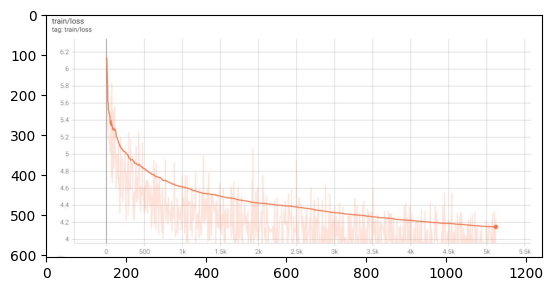

In [5]:
img = mpimg.imread('Loss_gckpt_graph.JPG')
imgplot = plt.imshow(img)

<a id='inference-example'></a>
 ## Inference example
 The below section helps to run the inference on the test images. The test images does not contain the bounding box and are not part of finetuning process. Post inference, one can see the retail images with bounding boxes predicted around the items. The before and after inference images are displayed for better visualization.<br>

Set below parameters in the command line correctly:

- --test_image_path = Path to the folder containing list of test .jpg example images. It is located by default in `/root/Gaudi-Solutions/retail/test_images` folder. These images are not part of train2017 or val2017 dataset.
- -c = Path to the directory where checkpoint obtained from the above finetuning step is stored.
- outputdir = Path of the output directory where inference result images will be stored. By default it the outputdir path is `/root/Gaudi-Solutions/retail/inference_result` and results are stored in folder `inference_result`
- --hmp-bf16 = Full path of `ops_bf16_yolox.txt` file
- --hmp-fp32 = Full path of `ops_fp32_yolox.txt` file
- --save-result = Saving the result to a directory

**Note:**<br>
(1) Make sure full path of the files `ops_bf16_yolox.txt` and  `ops_fp32_yolox.txt` located in Model-References' yolox directory as well as correct path of other files used in below command line is provided.<br>
(2) Make sure other parameters are kept as it is for running correct inference.<br>
(3) Post completion of command check for output inference results stored in the output folder before displaying results in next step.<br>
(4) The output logs of the command can be viewed directly in the terminal.

In [16]:
!python3 ./run_inference.py --hpu --hmp --test_image_path /root/Gaudi-Solutions/retail/test_images --hmp-bf16 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_bf16_yolox.txt --hmp-fp32 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_fp32_yolox.txt -c /root/Gaudi-Solutions/retail/yolox_output_finetune_1x_16/yolox_s/best_ckpt.pth --save_result output_dir /root/Gaudi-Solutions/retail/inference_result train_ann "annot_sku_train.json" val_ann "annot_sku_val.json" num_classes 1

### Display the inference results

In [17]:
def display_images(test_image_path, result_image_path):
    def get_image_list(image_path):
        image_names = []
        for maindir, subdir, file_name_list in os.walk(image_path):
            for filename in file_name_list:
                apath = os.path.join(maindir, filename)
                ext = os.path.splitext(apath)[1]
                image_names.append(apath)
        return image_names

    if os.path.isdir(test_image_path):
        test_files = get_image_list(test_image_path)
        test_files.sort()
    if os.path.isdir(result_image_path):
        result_files = get_image_list(result_image_path)
        result_files.sort()
        
    for test_img, res_img in zip(test_files, result_files):
        #Plot the images
        img_input = mpimg.imread(test_img)
        img_output = mpimg.imread(res_img)

        fig, ax = plt.subplots(1,2, figsize=(20,10))
        ax[0].imshow(img_input)
        ax[0].axis('off')
        ax[0].title.set_text("Before Inference")
        ax[1].imshow(img_output)
        ax[1].axis('off')
        ax[1].title.set_text("After Inference")
        plt.tight_layout()
        plt.show(block=True)
        

Set the correct path for the below variables to display the inference results.
- test_image_path = Location of path where test images are located. By deafult it is `/root/Gaudi-Solutions/retail/test_images`
- result_image_path = Location of path where inference result images generated from above step are saved. By default it is `/root/Gaudi-Solutions/retail/inference_result/`

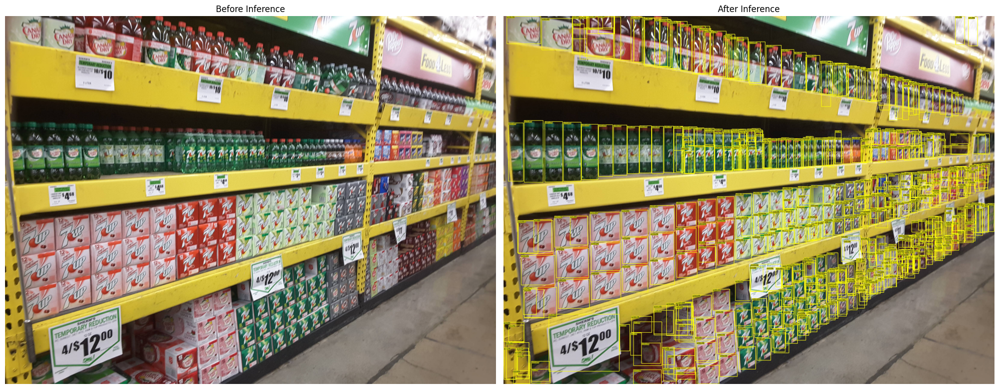

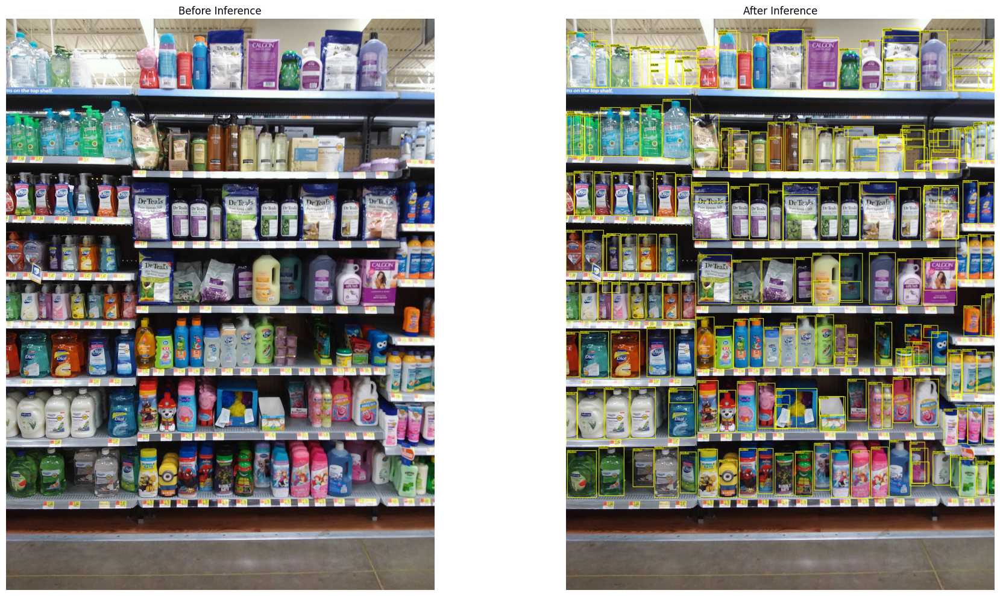

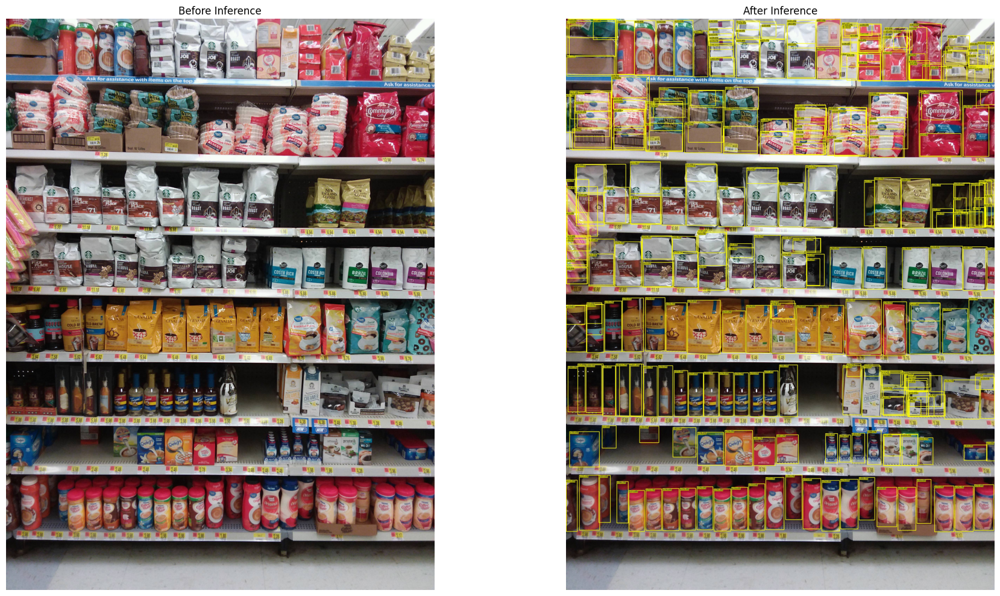

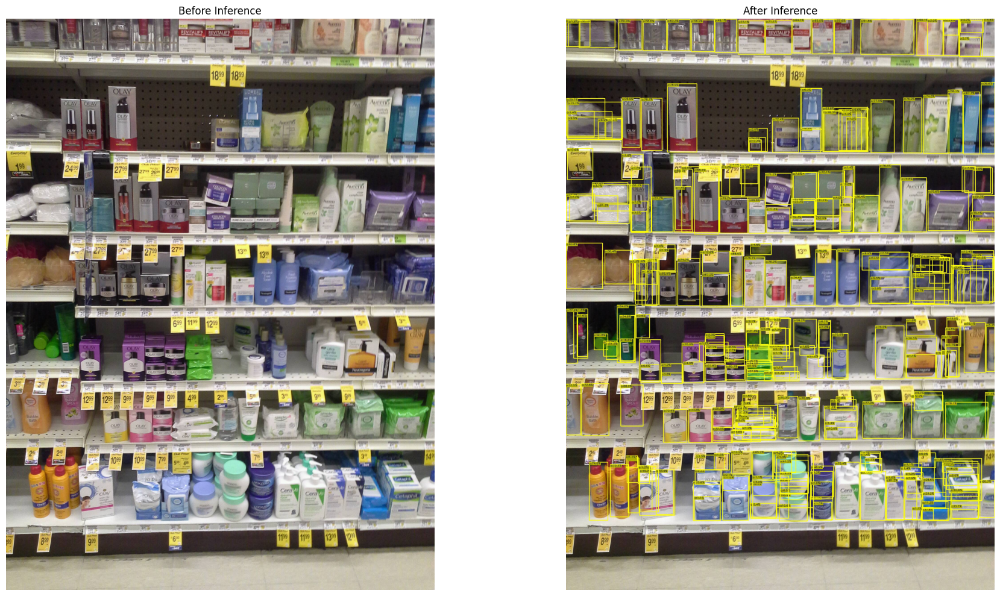

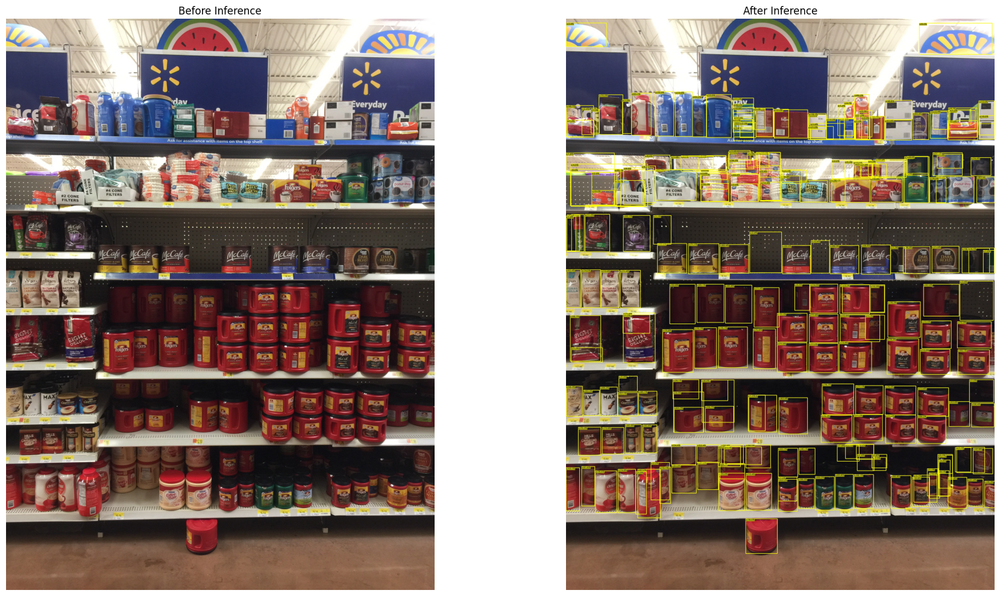

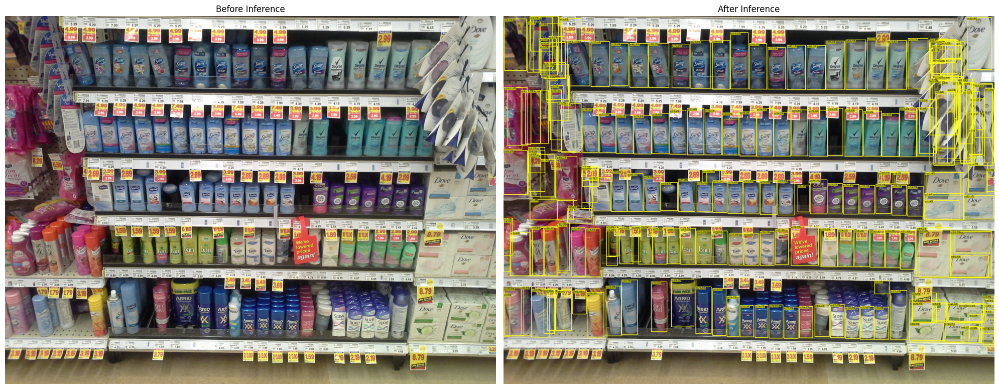

In [19]:
test_image_path='/root/Gaudi-Solutions/retail/test_images'
result_image_path='/root/Gaudi-Solutions/retail/inference_result/'
display_images(test_image_path,result_image_path)

<a id='multicard'></a>
## Finetuning on 8 HPUs
The above transfer learning task can be done using 8 HPUs directly in the terminal. The 8 HPUs training can be initiated using the script available in Model-References [GitHub YOLOX directory](https://github.com/HabanaAI/Model-References/tree/master/PyTorch/computer_vision/detection/yolox). Follow all the steps in setup process to pull the Model-References repository and then naviagte to the YOLOX directory in Model-References. Run the feature extraction and finetuning commands mentioned below by setting the correct directory paths at user's end.

**Note:**<br>
(1) Run below command directly in the terminal. Please make sure the current path in termainal is point to the location of Model-References repository.
<br>(2) Make sure all the paths of parameters in command line are pointing correctly to the dataset and checkpoint.

### Feature extration on 8 HPUs

In [ ]:
python3 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/tools/train.py --name yolox-s --devices 8 --batch-size 32 --data_dir /root/data/SKU110K/SKU110K_fixed/ --hpu --hmp --hmp-bf16 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_bf16_yolox.txt --hmp-fp32 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_fp32_yolox.txt --freeze --noresize -c /root/Gaudi-Solutions/retail/yolox_s.pth max_epoch 1 warmup_epochs 0 output_dir ./yolox_output_feature_8x_32 train_ann "annot_sku_train.json" val_ann "annot_sku_val.json" num_classes 1

### Finetuning on 8 HPUs

In [ ]:
python3 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/tools/train.py --name yolox-s --devices 8 --batch-size 32 --data_dir /root/data/SKU110K/SKU110K_fixed/ --hpu --hmp --hmp-bf16 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_bf16_yolox.txt --hmp-fp32 /root/Gaudi-Solutions/retail/Model-References/PyTorch/computer_vision/detection/yolox/ops_fp32_yolox.txt --noresize -c ./yolox_output_feature_8x_32/yolox_s/best_ckpt.pth max_epoch 8 warmup_epochs 0 output_dir ./yolox_output_finetune_8x_32 train_ann "annot_sku_train.json" val_ann "annot_sku_val.json" num_classes 1

## Reference
Ge, Z., Liu, S., Wang, F., Li, Z., & Sun, J. (2021). YOLOX: Exceeding YOLO Series in 2021. arXiv preprint arXiv:2107.08430